In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from scipy import stats
from sklearn.preprocessing import StandardScaler

# 유방암 주성분 분석

## 데이터 정제 및 이상치 제거

In [2]:
data = pd.read_csv("./유방암.csv", engine='python')
data.head()

,diagnosis,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,0,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,0,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,0,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,0,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [3]:
table = str.maketrans(' ', '_')
rename_dict = { col:col.lower().translate(table)  for col in data.columns}

data.rename(columns=rename_dict,inplace=True)
data.columns

Index(['diagnosis', 'mean_radius', 'mean_texture', 'mean_perimeter',
       'mean_area', 'mean_smoothness', 'mean_compactness', 'mean_concavity',
       'mean_concave_points', 'mean_symmetry', 'mean_fractal_dimension',
       'radius_error', 'texture_error', 'perimeter_error', 'area_error',
       'smoothness_error', 'compactness_error', 'concavity_error',
       'concave_points_error', 'symmetry_error', 'fractal_dimension_error',
       'worst_radius', 'worst_texture', 'worst_perimeter', 'worst_area',
       'worst_smoothness', 'worst_compactness', 'worst_concavity',
       'worst_concave_points', 'worst_symmetry', 'worst_fractal_dimension'],
      dtype='object')

In [4]:
df_x = data.drop('diagnosis',axis=1)
df_y = data.diagnosis

In [5]:
df_y.value_counts()

1    357
0    212
Name: diagnosis, dtype: int64

## 상관도

##### 유방암 데이터는 설명변수가 많다.   주성분 분석을 통해 차원을 축소하여 본다.

In [11]:
df_x.corr()

,mean_radius,mean_texture,mean_perimeter,mean_area,mean_smoothness,mean_compactness,mean_concavity,mean_concave_points,mean_symmetry,mean_fractal_dimension,...,worst_radius,worst_texture,worst_perimeter,worst_area,worst_smoothness,worst_compactness,worst_concavity,worst_concave_points,worst_symmetry,worst_fractal_dimension
mean_radius,1.000000,0.323782,0.997855,0.987357,0.170581,0.506124,0.676764,0.822529,0.147741,-0.311631,...,0.969539,0.297008,0.965137,0.941082,0.119616,0.413463,0.526911,0.744214,0.163953,0.007066
mean_texture,0.323782,1.000000,0.329533,0.321086,-0.023389,0.236702,0.302418,0.293464,0.071401,-0.076437,...,0.352573,0.912045,0.358040,0.343546,0.077503,0.277830,0.301025,0.295316,0.105008,0.119205
mean_perimeter,0.997855,0.329533,1.000000,0.986507,0.207278,0.556936,0.716136,0.850977,0.183027,-0.261477,...,0.969476,0.303038,0.970387,0.941550,0.150549,0.455774,0.563879,0.771241,0.189115,0.051019
mean_area,0.987357,0.321086,0.986507,1.000000,0.177028,0.498502,0.685983,0.823269,0.151293,-0.283110,...,0.962746,0.287489,0.959120,0.959213,0.123523,0.390410,0.512606,0.722017,0.143570,0.003738
mean_smoothness,0.170581,-0.023389,0.207278,0.177028,1.000000,0.659123,0.521984,0.553695,0.557775,0.584792,...,0.213120,0.036072,0.238853,0.206718,0.805324,0.472468,0.434926,0.503053,0.394309,0.499316
mean_compactness,0.506124,0.236702,0.556936,0.498502,0.659123,1.000000,0.883121,0.831135,0.602641,0.565369,...,0.535315,0.248133,0.590210,0.509604,0.565541,0.865809,0.816275,0.815573,0.510223,0.687382
mean_concavity,0.676764,0.302418,0.716136,0.685983,0.521984,0.883121,1.000000,0.921391,0.500667,0.336783,...,0.688236,0.299879,0.729565,0.675987,0.448822,0.754968,0.884103,0.861323,0.409464,0.514930
mean_concave_points,0.822529,0.293464,0.850977,0.823269,0.553695,0.831135,0.921391,1.000000,0.462497,0.166917,...,0.830318,0.292752,0.855923,0.809630,0.452753,0.667454,0.752399,0.910155,0.375744,0.368661
mean_symmetry,0.147741,0.071401,0.183027,0.151293,0.557775,0.602641,0.500667,0.462497,1.000000,0.479921,...,0.185728,0.090651,0.219169,0.177193,0.426675,0.473200,0.433721,0.430297,0.699826,0.438413
mean_fractal_dimension,-0.311631,-0.076437,-0.261477,-0.283110,0.584792,0.565369,0.336783,0.166917,0.479921,1.000000,...,-0.253691,-0.051269,-0.205151,-0.231854,0.504942,0.458798,0.346234,0.175325,0.334019,0.767297


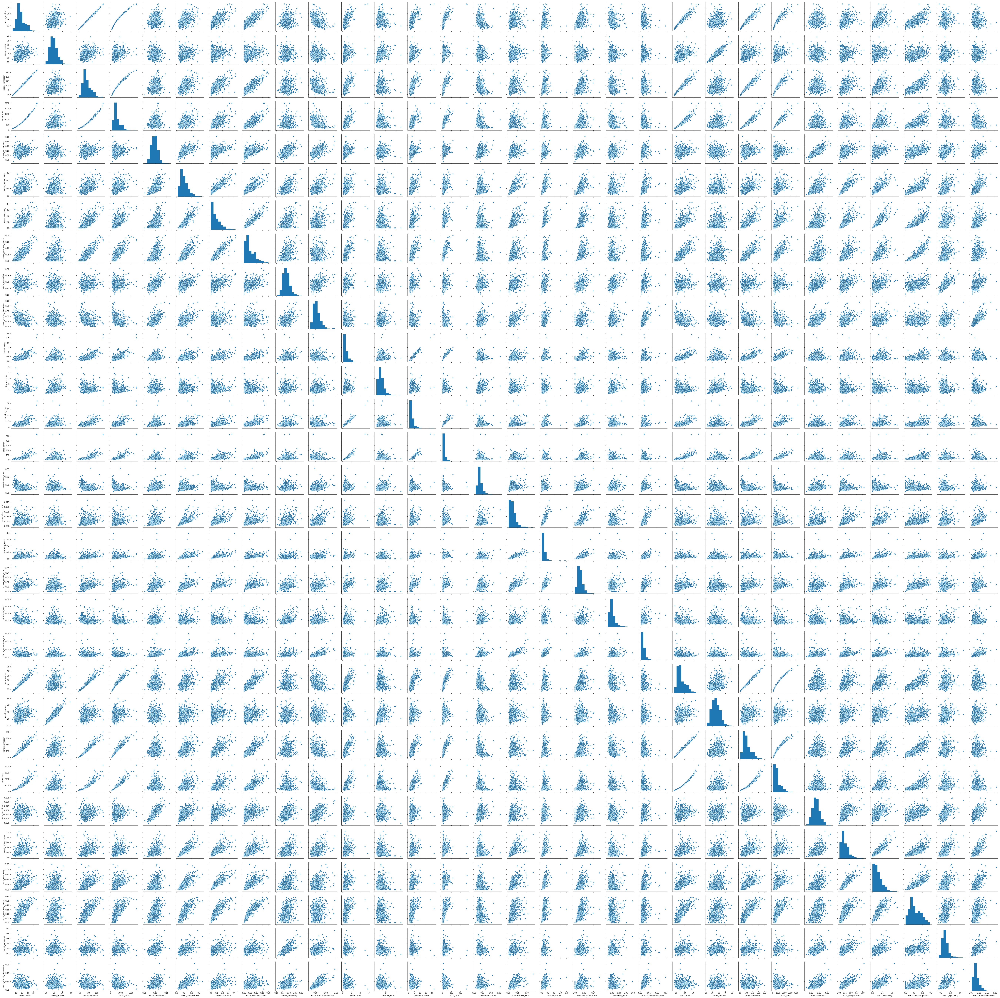

In [12]:
sns.pairplot(df_x)

## 데이터 스케일 조정

##### 주성분 분석은 유사한 값을 가져야 하므로 스케일 조정이 필요하다

In [6]:
scaler = StandardScaler()
df_x_scaled = scaler.fit_transform(df_x)
print("Scaled Data:\n {}".format(df_x_scaled[:3].round(3)))
print("Shape:\n {}".format(df_x_scaled.shape))

Scaled Data:
 [[ 1.097e+00 -2.073e+00  1.270e+00  9.840e-01  1.568e+00  3.284e+00
   2.653e+00  2.532e+00  2.218e+00  2.256e+00  2.490e+00 -5.650e-01
   2.833e+00  2.488e+00 -2.140e-01  1.317e+00  7.240e-01  6.610e-01
   1.149e+00  9.070e-01  1.887e+00 -1.359e+00  2.304e+00  2.001e+00
   1.308e+00  2.617e+00  2.110e+00  2.296e+00  2.751e+00  1.937e+00]
 [ 1.830e+00 -3.540e-01  1.686e+00  1.909e+00 -8.270e-01 -4.870e-01
  -2.400e-02  5.480e-01  1.000e-03 -8.690e-01  4.990e-01 -8.760e-01
   2.630e-01  7.420e-01 -6.050e-01 -6.930e-01 -4.410e-01  2.600e-01
  -8.050e-01 -9.900e-02  1.806e+00 -3.690e-01  1.535e+00  1.890e+00
  -3.760e-01 -4.300e-01 -1.470e-01  1.087e+00 -2.440e-01  2.810e-01]
 [ 1.580e+00  4.560e-01  1.567e+00  1.559e+00  9.420e-01  1.053e+00
   1.363e+00  2.037e+00  9.400e-01 -3.980e-01  1.229e+00 -7.800e-01
   8.510e-01  1.181e+00 -2.970e-01  8.150e-01  2.130e-01  1.425e+00
   2.370e-01  2.940e-01  1.512e+00 -2.400e-02  1.347e+00  1.456e+00
   5.270e-01  1.083e+00  8.550e-

### 주성분 점수

##### 설명변수 30개에 대하여 고유 벡터를 계산하고, 고유 벡터의 계수를 이용하여 주성분 점수를 계산한다.

In [7]:
pca = PCA(n_components=30)
x_pca = pca.fit_transform(df_x_scaled)
print("PCA Data:\n {}".format(x_pca[:5].round(3)))
print("PCA Shape:\n {}".format(x_pca.shape))
df_x_pca = pd.DataFrame(x_pca, columns=["Prin"+str(i) for i in range(1,31)])

PCA Data:
 [[ 9.1930e+00  1.9490e+00 -1.1230e+00  3.6340e+00 -1.1950e+00  1.4110e+00
   2.1590e+00 -3.9800e-01 -1.5700e-01 -8.7700e-01  2.6300e-01 -8.5900e-01
   1.0300e-01 -6.9100e-01 -6.0200e-01  7.4500e-01 -2.6500e-01 -5.5000e-01
  -1.3400e-01  3.4600e-01  9.7000e-02  6.9000e-02  8.5000e-02 -1.7500e-01
  -1.5100e-01 -2.0200e-01 -2.5300e-01 -3.4000e-02  4.6000e-02 -4.7000e-02]
 [ 2.3880e+00 -3.7680e+00 -5.2900e-01  1.1180e+00  6.2200e-01  2.9000e-02
   1.3000e-02  2.4100e-01 -7.1200e-01  1.1070e+00  8.1300e-01  1.5800e-01
  -9.4400e-01 -6.5300e-01  9.0000e-03 -6.4900e-01 -1.7000e-02  3.1800e-01
   2.4800e-01 -1.1400e-01 -7.7000e-02 -9.5000e-02 -2.1800e-01  1.1000e-02
  -1.7100e-01 -4.1000e-02  1.8100e-01  3.3000e-02 -6.0000e-03 -2.0000e-03]
 [ 5.7340e+00 -1.0750e+00 -5.5200e-01  9.1200e-01 -1.7700e-01  5.4100e-01
  -6.6800e-01  9.7000e-02  2.4000e-02  4.5400e-01 -6.0600e-01  1.2400e-01
  -4.1100e-01  1.7000e-02  4.8300e-01  3.2500e-01  1.9100e-01 -8.8000e-02
   3.9300e-01 -2.0500e-01

### 주성분 기여율

##### 주성분 변수가 원래 특성의 총 변동을 설명하는 정도이다.

In [8]:
df_pca = pd.DataFrame()
df_pca["Prin"] = [i for i in range(1,31)]
df_pca["EigenValues"] = pca.explained_variance_
df_pca["EigenValueRatio"] = pca.explained_variance_ratio_
df_pca["CumsumEigenValueRatio"] = np.cumsum(pca.explained_variance_ratio_)
df_pca.round(3)

,Prin,EigenValues,EigenValueRatio,CumsumEigenValueRatio
0,1,13.305,0.443,0.443
1,2,5.701,0.190,0.632
2,3,2.823,0.094,0.726
3,4,1.984,0.066,0.792
4,5,1.652,0.055,0.847
5,6,1.209,0.040,0.888
6,7,0.676,0.023,0.910
7,8,0.477,0.016,0.926
8,9,0.418,0.014,0.940
9,10,0.351,0.012,0.952


In [ ]:
# pd.DataFrame(pca.components_,columns=df_x.columns)
df_feature = pd.DataFrame({'Feature':df_x.columns})
df_eigenvectors = pd.concat([df_feature, pd.DataFrame(pca.components_,columns=["Prin"+str(i) for i in range(1,31)])],axis=1)
sns.pairplot(df_eigenvectors,hue='Feature')

/home/pirl/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/home/pirl/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:140: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/pirl/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:132: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/home/pirl/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/bandwidths.py:20: RuntimeWarning: invalid value encountered in minimum
  return np.minimum(np.std(X, axis=0, ddof=1), IQR)
/home/pirl/anaconda3/lib/python3.7/site-packages/numpy/core/fr

/home/pirl/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/home/pirl/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:140: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/pirl/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:132: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/home/pirl/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/bandwidths.py:20: RuntimeWarning: invalid value encountered in minimum
  return np.minimum(np.std(X, axis=0, ddof=1), IQR)
/home/pirl/anaconda3/lib/python3.7/site-packages/numpy/core/fr

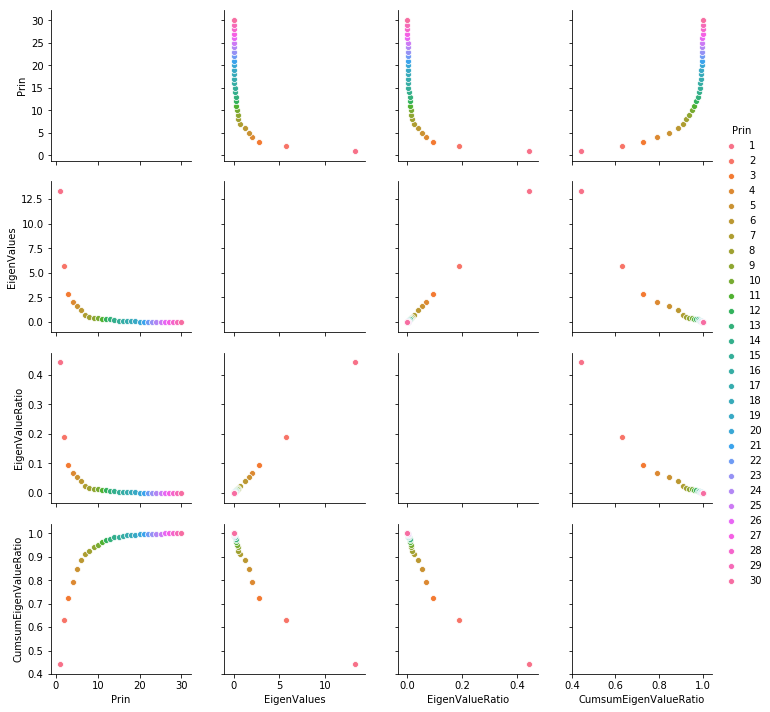

In [11]:
sns.pairplot(df_pca,hue='Prin')
# df_feature

/home/pirl/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/home/pirl/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:140: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/pirl/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:132: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/home/pirl/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/bandwidths.py:20: RuntimeWarning: invalid value encountered in minimum
  return np.minimum(np.std(X, axis=0, ddof=1), IQR)
/home/pirl/anaconda3/lib/python3.7/site-packages/numpy/core/fr

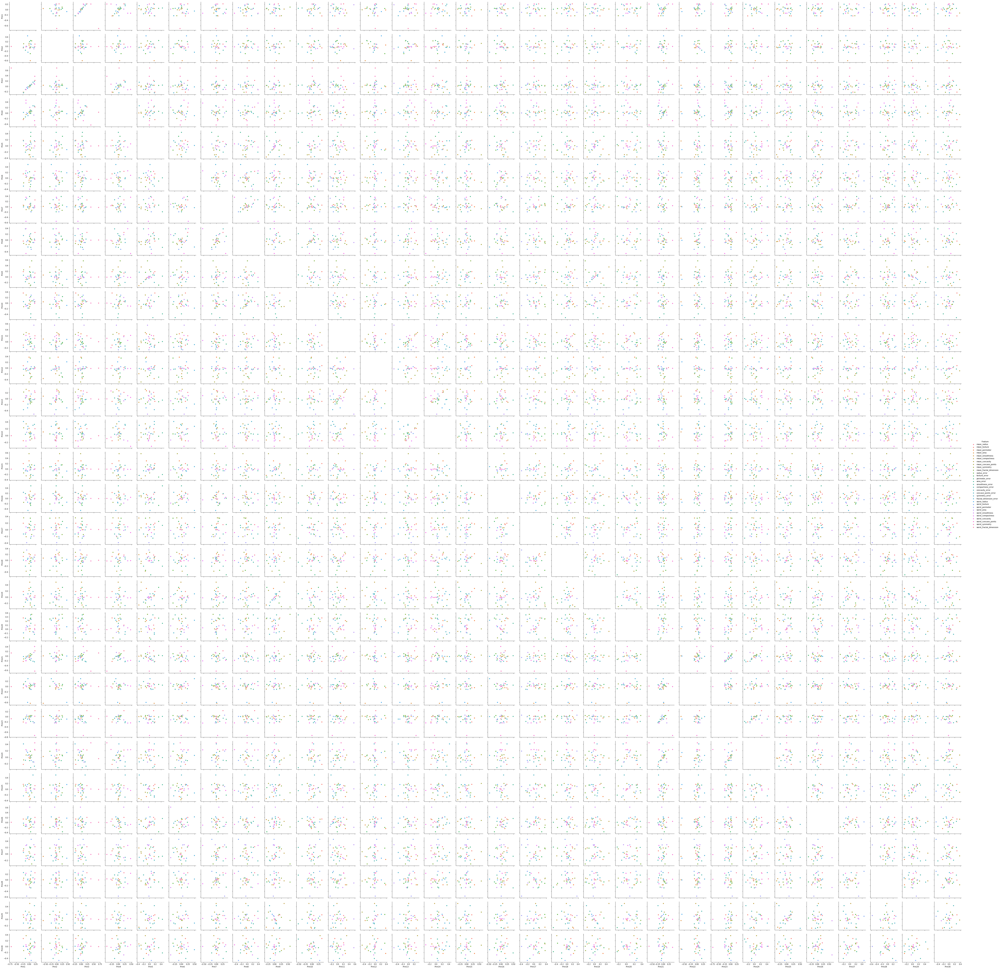

In [19]:
df_feature = pd.DataFrame({'Feature':df_x.columns})
df_eigenvectors = pd.concat([df_feature, pd.DataFrame(pca.components_,columns=["Prin"+str(i) for i in range(1,31)])],axis=1)
sns.pairplot(df_eigenvectors,hue='Feature')

### 주성분 개수 결정

##### 급격히 감소하는 지점에서 개수를 결정한다.

,Prin1,Prin2,Prin3,Prin4,Prin5,Prin6,Prin7,Prin8,Prin9,Prin10,...,Prin21,Prin22,Prin23,Prin24,Prin25,Prin26,Prin27,Prin28,Prin29,Prin30
Prin1,1.0,-0.0,0.0,-0.0,0.0,-0.0,-0.0,-0.0,-0.0,0.0,...,-0.0,-0.0,0.0,-0.0,0.0,-0.0,-0.0,0.0,-0.0,0.0
Prin2,-0.0,1.0,0.0,0.0,0.0,-0.0,-0.0,-0.0,-0.0,0.0,...,-0.0,0.0,0.0,-0.0,0.0,-0.0,0.0,-0.0,0.0,0.0
Prin3,0.0,0.0,1.0,0.0,-0.0,-0.0,-0.0,-0.0,0.0,-0.0,...,-0.0,0.0,-0.0,0.0,0.0,0.0,-0.0,0.0,-0.0,-0.0
Prin4,-0.0,0.0,0.0,1.0,-0.0,0.0,-0.0,-0.0,-0.0,0.0,...,-0.0,0.0,-0.0,0.0,0.0,-0.0,-0.0,0.0,0.0,-0.0
Prin5,0.0,0.0,-0.0,-0.0,1.0,-0.0,0.0,0.0,-0.0,-0.0,...,-0.0,0.0,-0.0,0.0,0.0,-0.0,-0.0,0.0,0.0,-0.0
Prin6,-0.0,-0.0,-0.0,0.0,-0.0,1.0,-0.0,0.0,0.0,-0.0,...,0.0,0.0,0.0,-0.0,-0.0,0.0,0.0,-0.0,-0.0,0.0
Prin7,-0.0,-0.0,-0.0,-0.0,0.0,-0.0,1.0,0.0,-0.0,-0.0,...,-0.0,-0.0,0.0,0.0,-0.0,-0.0,0.0,0.0,0.0,0.0
Prin8,-0.0,-0.0,-0.0,-0.0,0.0,0.0,0.0,1.0,-0.0,-0.0,...,0.0,0.0,-0.0,-0.0,0.0,0.0,0.0,-0.0,-0.0,0.0
Prin9,-0.0,-0.0,0.0,-0.0,-0.0,0.0,-0.0,-0.0,1.0,0.0,...,0.0,-0.0,0.0,-0.0,0.0,0.0,-0.0,-0.0,-0.0,0.0
Prin10,0.0,0.0,-0.0,0.0,-0.0,-0.0,-0.0,-0.0,0.0,1.0,...,-0.0,0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,0.0


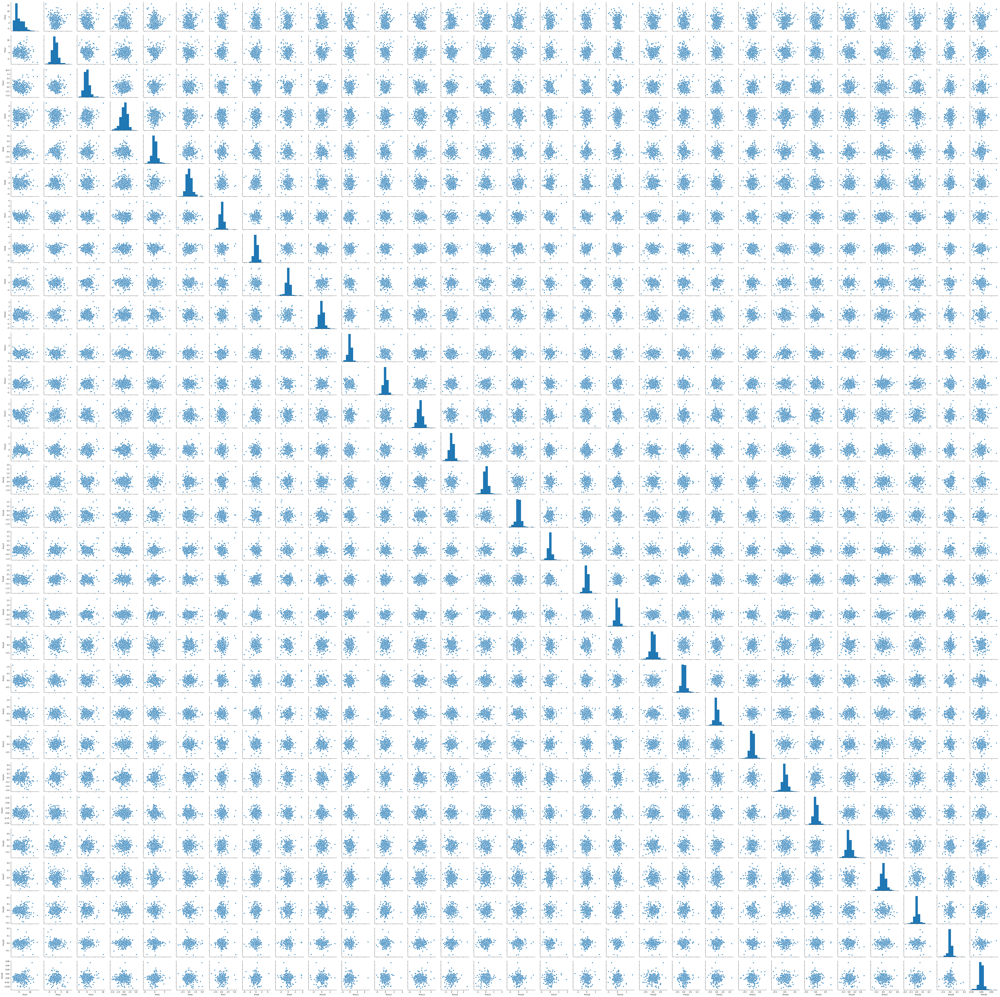

In [11]:
sns.pairplot(df_x_pca)
df_x_pca.corr().round(3)

In [15]:
pd.DataFrame(pca.components_)

,0,1,2,3,4,5,6,7,8,9,...,20,21,22,23,24,25,26,27,28,29
0,0.218902,0.103725,0.227537,0.220995,0.142590,0.239285,0.258400,0.260854,0.138167,0.064363,...,0.227997,0.104469,0.236640,0.224871,0.127953,0.210096,0.228768,0.250886,0.122905,0.131784
1,-0.233857,-0.059706,-0.215181,-0.231077,0.186113,0.151892,0.060165,-0.034768,0.190349,0.366575,...,-0.219866,-0.045467,-0.199878,-0.219352,0.172304,0.143593,0.097964,-0.008257,0.141883,0.275339
2,-0.008531,0.064550,-0.009314,0.028700,-0.104292,-0.074092,0.002734,-0.025564,-0.040240,-0.022574,...,-0.047507,-0.042298,-0.048547,-0.011902,-0.259798,-0.236076,-0.173057,-0.170344,-0.271313,-0.232791
3,0.041409,-0.603050,0.041983,0.053434,0.159383,0.031795,0.019123,0.065336,0.067125,0.048587,...,0.015417,-0.632808,0.013803,0.025895,0.017652,-0.091328,-0.073951,0.006007,-0.036251,-0.077053
4,0.037786,-0.049469,0.037375,0.010331,-0.365089,0.011704,0.086375,-0.043861,-0.305941,-0.044424,...,-0.004407,-0.092883,0.007454,-0.027391,-0.324435,0.121804,0.188519,0.043332,-0.244559,0.094423
5,0.018741,-0.032179,0.017308,-0.001888,-0.286374,-0.014131,-0.009344,-0.052050,0.356458,-0.119431,...,-0.000291,-0.050008,0.008501,-0.025164,-0.369255,0.047706,0.028379,-0.030873,0.498927,-0.080224
6,-0.124088,0.011400,-0.114477,-0.051653,-0.140669,0.030918,-0.107520,-0.150482,-0.093891,0.295760,...,-0.009710,0.009871,-0.000446,0.067832,-0.108831,0.140473,-0.060488,-0.167967,-0.018491,0.374658
7,-0.007452,0.130675,-0.018687,0.034674,-0.288975,-0.151396,-0.072827,-0.152322,-0.231531,-0.177121,...,0.042619,0.036252,0.030559,0.079394,0.205852,0.084020,0.072468,-0.036171,0.228225,0.048361
8,-0.223110,0.112699,-0.223739,-0.195586,0.006425,-0.167841,0.040591,-0.111971,0.256040,-0.123741,...,-0.112141,0.103341,-0.109614,-0.080732,0.112316,-0.100678,0.161909,0.060488,0.064638,-0.134174
9,0.095486,0.240934,0.086386,0.074956,-0.069293,0.012936,-0.135602,0.008055,0.572069,0.081103,...,0.077362,0.029551,0.050508,0.069921,-0.128305,-0.172134,-0.311639,-0.076648,-0.029563,0.012610


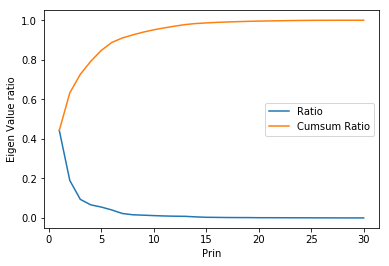

In [9]:
plt.plot(df_pca.Prin,df_pca.EigenValueRatio,label="Ratio")
plt.plot(df_pca.Prin, df_pca.CumsumEigenValueRatio,label="Cumsum Ratio")

plt.ylabel("Eigen Value ratio")
plt.xlabel("Prin")
plt.legend(loc="best")

In [8]:
df_pca = pd.DataFrame()
df_pca["Prin"] = [i for i in range(1,31)]
df_pca["EigenValues"] = pca.explained_variance_
df_pca["EigenValueRatio"] = pca.explained_variance_ratio_
df_pca["CumsumEigenValueRatio"] = np.cumsum(pca.explained_variance_ratio_)
df_pca.round(3)

,Prin,EigenValues,EigenValueRatio,CumsumEigenValueRatio
0,1,13.305,0.443,0.443
1,2,5.701,0.190,0.632
2,3,2.823,0.094,0.726
3,4,1.984,0.066,0.792
4,5,1.652,0.055,0.847
5,6,1.209,0.040,0.888
6,7,0.676,0.023,0.910
7,8,0.477,0.016,0.926
8,9,0.418,0.014,0.940
9,10,0.351,0.012,0.952


##### 2개까지 급격히 변화하고 나마지 부터 완만하게 변화하는 것을 알 수 있다.

In [1]:
import statsmodels.api as sm
from sklearn.model_selection import train_test_split

x_var = ["Prin"+str(i) for i in range(1,62)]
df_x_pca_const = sm.add_constant(df_x_pca[x_var])

X_train, X_test, y_train, y_test = train_test_split(df_x_pca_const, df_y, test_size = 0.3, random_state= 2222)

reg_model = sm.OLS(y_train,X_train).fit()
print(reg_model.summary())

NameError: name 'df_x_pca' is not defined

##### 최종 선택 한 변수의 개수는 2개